In [3]:
import pyFAI
import numpy as np
import scipy as sp
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots
import fabio
import pyFAI.gui
import pyFAI.detectors
import pyFAI.calibrant
from pyFAI.gui import jupyter
import silx
import pygix
import math
import os
from PIL import Image

print("Using pyFAI version",pyFAI.version) #This should be version 21.3 (version 20.0 does not have jupyter integration

Using pyFAI version 0.21.3


In [2]:
#iPython magic to make interactive plots work
%matplotlib widget

<AxesSubplot:>

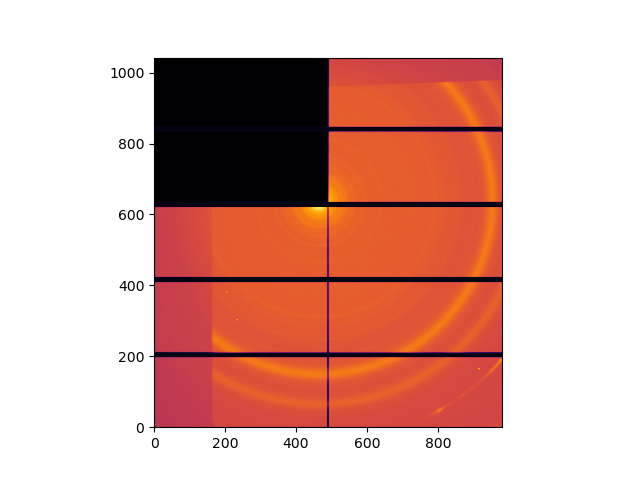

In [10]:
#Declare your path to calibration folder
# calib_path ='/Volumes/One Touch/NSLS2_Oct2022/AgBH_cali_5m_13.5kev_x0.000_th0.000_5.00s_752220_waxs.tiff'
calib_path ='/Volumes/One Touch/NSLS2_March2023/analysis/calibration/AgBH_cali_2m_13.5kev_x0.000_th0.000_10.00s_987922_waxs.tiff'

#Select calibration file
img = fabio.open(calib_path).data
# img = fabio.open('/Volumes/One Touch/NSLS2_Oct2022/800k_mask_stitched.edf').data

#pyFAI.gui command to display 2D detector image
jupyter.display(img)

In [21]:
from pyFAI.test.utilstest import UtilsTest
from pyFAI.calibrant import CALIBRANT_FACTORY
from pyFAI.gui.jupyter.calib import Calibration
import pyFAI.detectors

#Declare your path to calibration folder
calib_path ='/Volumes/One Touch/NSLS2_March2023/analysis/calibration/AgBH_cali_2m_13.5kev_x0.000_th0.000_10.00s_987922_waxs.tiff'

#initialize parameters of the scan
#wavelength in meters
wavelength = 0.9764e-10 
#detector names can be found at https://pyfai.readthedocs.io/en/master/api/detectors/index.html
pilatus = pyFAI.detector_factory('Pilatus1M')
AgBh = pyFAI.calibrant.CALIBRANT_FACTORY("CeO2")
AgBh.wavelength=wavelength

#load calibration file
img = fabio.open(calib_path).data

#load mask file. Mask can be made by opening terminal window and running pyFAI-calib2
#note that this calib2 program can only import tiff or edf files
mask = fabio.open('/Volumes/One Touch/NSLS2_Oct2022/800k_mask_stitched.edf').data

#display calibration widget
calib = Calibration(img, calibrant=AgBh, wavelength=wavelength, detector=pilatus)

###Calibration widget instructions
# 1. Set the ring number (0-based value), below the plot
# 2. Pick the ring by right-clicking with the mouse on the image.
# 3. Start at 0 for the first ring
# 4. Click refine to launch the calibration.
# Other notes: 
# "left click + d" to remove current group, 
# "right click + m" to find more points for current group
# "left click + 1" erase closest point from current group
# "left click + b" create new group with single point
# "left click + v" add single point to current group

##you can also use pyFAI-calib2 command in terminal and use the old gui with a custom defined detector if widget doesnt work

In [6]:
# from pyFAI.test.utilstest import UtilsTest
# from pyFAI.calibrant import CALIBRANT_FACTORY
# from pyFAI.gui.jupyter.calib import Calibration
# import pyFAI.detectors

# calib_path = '/Volumes/One Touch/NSLS2_Feb2023/MToney/calib/'

# wl = 0.9183e-10
# #detector names can be found at https://pyfai.readthedocs.io/en/master/api/detectors/index.html
# pilatus = pyFAI.detector_factory('Pilatus1M')


# pixel_size = 172e-6
# centx = 466
# centy = 658
# poni1 = centy*pixel_size
# poni2 = centx*pixel_size
# sdd = 0.261


# pg = pygix.Transform(dist=sdd, poni1=poni1, poni2=poni2, rot1=0, rot2=0,
#                      rot3=0, wavelength =wl, detector=pilatus)
# print(pg)

Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.183000e-11m
SampleDetDist= 2.610000e-01m	PONI= 1.131760e-01, 8.015200e-02m	rot1=0.000000  rot2= 0.000000  rot3= 0.000000 rad
DirectBeamDist= 261.000mm	Center: x=466.000, y=658.000 pix	Tilt=0.000 deg  tiltPlanRotation= 0.000 deg


In [14]:
#Saves calibration information
gr = calib.geoRef
#Prints info on the fit
print(gr)
print(calib.fixed)
print(gr.chi2())
#save to .poni file for use in pygix
gr.save(calib_path + 'CeO2.poni')

Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.764000e-11m
SampleDetDist= 2.583240e-01m	PONI= 1.162760e-01, 8.150584e-02m	rot1=0.004377  rot2= -0.023818  rot3= 0.000000 rad
DirectBeamDist= 258.400mm	Center: x=467.298, y=640.244 pix	Tilt=1.388 deg  tiltPlanRotation= -100.410 deg
['wavelength', 'rot3']
0.0013019861922462708


In [15]:
#Optional new fit with rotations fixed to 0
#This is likely the best fit for transmission geometry
gr = calib.geoRef
gr.rot1=gr.rot2=gr.rot3=0
# gr.center_array=[318, 1277]
# gr.set_dist = 2.837
gr.refine3(fix=['wavelength', 'rot1', 'rot2', 'rot3'])
print(gr.chi2())
print(gr)
gr.save(calib_path + 'CeO2_fixed.poni')

0.0013415167453831199
Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.764000e-11m
SampleDetDist= 2.589481e-01m	PONI= 1.095102e-01, 8.010766e-02m	rot1=0.000000  rot2= 0.000000  rot3= 0.000000 rad
DirectBeamDist= 258.948mm	Center: x=465.742, y=636.687 pix	Tilt=0.000 deg  tiltPlanRotation= 0.000 deg


In [22]:
#The next four cells are just to verify that the calibration is good (overlays expected calibrant peaks with reduced data)
#azimuthal integrator tool in pyFAI for transmission mode (use pygix for GI geometry)
#load the .poni calibration file into azimuthal integrator "ai"
ai = pyFAI.load('/Volumes/One Touch/NSLS2_March2023/analysis/calibration/CeO2_fixed.poni')

In [23]:
res1 = ai.integrate1d(img, 1000) #circular integration
res2 = ai.integrate2d(img, 1000) #makes caked 2d image (q vs chi)


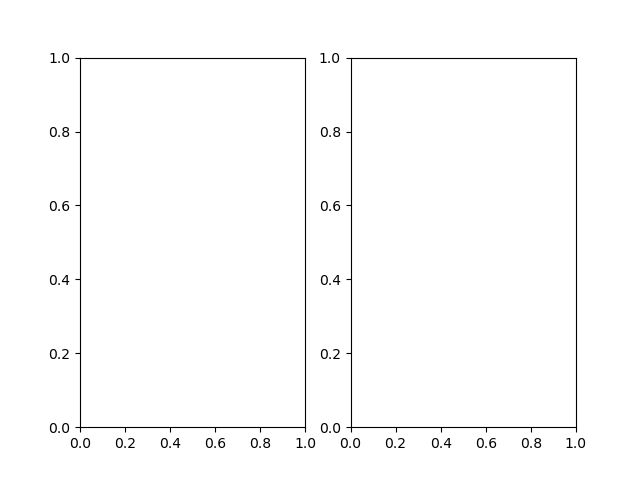

In [24]:
#initialize some interactive plots
from matplotlib.pyplot import subplots
fig, (ax1, ax2) = subplots(1, 2)



In [25]:
#populating plots with pyFAI.gui jupyter command
jupyter.plot1d(res1, ax=ax1, calibrant=AgBh)
jupyter.plot2d(res2, ax=ax2, calibrant=AgBh)
ax2.set_title('2D cake')
plt.tight_layout()

In [3]:
#apply sin(chi) correction to each pixel of the caked image
def sin_chi_cake(sam_cake):
    sam_cake_corr = []    
    for row in range(np.shape(sam_cake)[0]):
        new_row = np.sin(np.radians(np.abs(chi[row]))) * sam_cake[row, :]
        sam_cake_corr.append(new_row)
    sam_cake_corr = np.asarray(sam_cake_corr)
    return sam_cake_corr

#Generate sin(chi) corrected q vs intensity linecuts from corrected cake image   
def q_integrate(cake_corr_img, qr, q_limits, chi, chi_limits, filepath):
    upper_chi = chi_limits[1]
    lower_chi = chi_limits[0]
    upper_q = q_limits[1]
    lower_q = q_limits[0]
    q_data = []
    int_array = np.empty(np.shape(cake_corr_img))
    int_array[:] = np.nan
    
    #recursively scan each row and column to see if the pixel is within bounds
    for row in range(np.shape(cake_corr_img)[0]):
        for column in range(np.shape(cake_corr_img)[1]):
            if lower_q <= qr[column] <= upper_q and lower_chi <= chi[row] <= upper_chi:
                #add pixels within bounds to new int_array
                int_array[row,column] = cake_corr_img[row,column]
            if cake_corr_img[row,column] < 0.5:
                int_array[row,column] = np.nan
    # print(int_array)
    # print(np.min(int_array))
                
    #sum int_array across all chi giving q vs intensity
    int_data = np.nanmean(int_array, axis=0)
    qr = qr[int_data!=0]
    int_data = int_data[int_data!=0]
    out_data = np.stack([qr, int_data], axis=1)
    np.savetxt(filepath, out_data)

#Generate sin(chi) corrected chi vs intensity linecuts from corrected cake image
#this function uses the values at edge of q limits to create a linear background for each chi
#the linear background is subtracted before integrating
def chi_integrate(cake_corr_img, qr, q_limits, chi, chi_limits, filepath):
    upper_chi = chi_limits[1]
    lower_chi = chi_limits[0]
    upper_q = q_limits[1]
    lower_q = q_limits[0]
    
    #these two are for linear interpolation of peak background
    upper_q_bkg = q_limits[1]+0.02
    lower_q_bkg = q_limits[0]-0.02
    
    #some empty lists for appending
    q_data = []
    bkg_upper = []
    bkg_lower = []
    
    #some zeros arrays that will be re-assigned in loops
    int_array = np.zeros(np.shape(cake_corr_img))
    bkg_upper_data = np.zeros(np.shape(chi))
    bkg_lower_data = np.zeros(np.shape(qr))
    
    #flag variable in case there is detector gap partially covering a peak
    flag = 0 
    
    #recursively go through each row on cake image, if it is within chi range then scan columns
    for row in range(np.shape(cake_corr_img)[0]):
        if lower_chi <= chi[row] <= upper_chi:
            for column in range(np.shape(cake_corr_img)[1]):
                
                #this grabs values in "lower and upper bkg regions" for peak background
                if lower_q_bkg <= qr[column] <= lower_q:
                    bkg_lower.append(cake_corr_img[row,column])
                if upper_q <= qr[column] <= upper_q_bkg:
                    bkg_upper.append(cake_corr_img[row,column])
            
            #grab the median value of each background range for this given chi
            #median ensures an outlier pixel doesnt mess with background subtraction
            bkg_lower = np.asarray(bkg_lower)
            bkg_lower_data[row] = np.median(bkg_lower)
            bkg_upper = np.asarray(bkg_upper)
            bkg_upper_data[row] = np.median(bkg_upper)
            bkg_lower = []
            bkg_upper = []
    #recursively go through each row and column to see if pixel is within bounds
    for row in range(np.shape(cake_corr_img)[0]):
        for column in range(np.shape(cake_corr_img)[1]):
            if lower_q <= qr[column] <= upper_q and lower_chi <= chi[row] <= upper_chi:
                #Here is where linear interpolation of peak background occurs
                bkg_slope = ((bkg_upper_data[row] - bkg_lower_data[row])/(upper_q - lower_q))
                bkg_value = bkg_lower_data[row]+((qr[column]-lower_q)*bkg_slope)
                #background corrected intensity is saved
                if cake_corr_img[row,column] == 0:
                    flag = 1
                int_array[row,column] = cake_corr_img[row,column] - bkg_value
            bkg_value = 0
        if flag == 1:
            int_array[row,:] = int_array[row,:]*0
        flag = 0
    
    #intensities summed across q to give intensity vs chi plots
    int_data = np.sum(int_array, axis=1)
    int_data[int_data <= 0] = np.nan
    out_data = np.stack([chi, int_data], axis=1)
    np.savetxt(filepath, out_data)
    np.savetxt

In [13]:
#This cell recursively reduces data and saves to specificed folders
import glob
import re

#specify the path to where you want qmaps (2D images) and linecuts (1D data) saved
qmap_path = '/Volumes/One Touch/NSLS2_March2023/analysis/AL_giwaxs_analyzed/qmaps/'
q_linecut_path = '/Volumes/One Touch/NSLS2_March2023/analysis/AL_giwaxs_analyzed/q_linecuts/'
chi_linecut_path = '/Volumes/One Touch/NSLS2_March2023/analysis/AL_giwaxs_analyzed/chi_linecuts/'

#load up pygix transform object with your calibration (.poni) file
pg = pygix.Transform()
pg.load('/Volumes/One Touch/NSLS2_March2023/analysis/calibration/CeO2_fixed.poni')
#sample orientation is 3 for GIWAXS
pg.sample_orientation = 3
#load incident angle here (I have it mined from filename in later code if applicable)
pg.incident_angle = 0.10
#load your mask
mask = fabio.open('/Volumes/One Touch/NSLS2_Oct2022/800k_mask_stitched.edf').data

print(pg)

#initialize plot object, change directory to raw data folder, initialize counting variable
os.chdir('/Volumes/One Touch/NSLS2_March2023/waxs/AL_stitched')
i=0

#this loop retrieves all detector images and runs data reduction on each
for name in glob.glob('*'):
    fig, (ax1, ax2) = subplots(1,2, figsize=(10,7))
    sam = fabio.open(name).data
    
    #mine the shortened sample name from the filename
    name_idx_start = name.find('AL')
    name_idx_end = name.find('_pos')
    name_short = name[name_idx_start:name_idx_end+5]
    
    #mine the incident angle from filename and import it into pygix transform
    idx_start = name.find('_th')
    idx_start = idx_start + 3
    idx_end = idx_start + 5
    incident_angle = name[idx_start:idx_end]
    incident_angle = float(incident_angle)
    pg.incident_angle = incident_angle
    
    #mine the x-position of sample stage
    x_idx_start = name.find('x')
    x_idx_start = x_idx_start + 1
    x_idx_end = x_idx_start + 3
    x_pos = name[x_idx_start:x_idx_end]
    
    #create new shortened filename based on mined data
    filename_short = name_short + '_th' + str(incident_angle) + '_' + x_pos

    
    #Convert detector image to q-space
    sam_rec, qxy, qz = pg.transform_reciprocal(sam, 
                                               method = 'bbox', #for some reason splitpix doesnt work?
                                               unit='A',
                                               mask=mask,
                                               correctSolidAngle=True)
        
    #plot q space detector image
    img_min = np.percentile(sam_rec, 2)
    img_max = np.percentile(sam_rec, 99.95)
    ax1.imshow(sam_rec,
               norm=matplotlib.colors.Normalize(vmin=img_min,vmax=img_max),
               cmap='turbo',
               extent=(np.min(qxy),np.max(qxy),np.min(qz),np.max(qz)),
               origin = 'lower')
    ax1.set_ylim(0, 2)
    ax1.set_xlim(-1.2, 2)
    ax1.set_title('Intensity Not Sin(chi) Corrected')
    ax1.set_xlabel('$\mathregular{q_{xy}}$ ($\AA^{-1}$)')
    ax1.set_ylabel('$\mathregular{q_z}$ ($\AA^{-1}$)')
    ax1.tick_params(axis='both', which='major', labelsize=8)
    
    #convert detector image to caked qspace (chi vs q plot)
    sam_cake, qr, chi = pg.transform_image(sam, process='polar',
                                           method = 'bbox',
                                           unit='q_A^-1',
                                           mask=mask,
                                           correctSolidAngle=True)
    #apply sin(chi) correction to each pixel of the caked image
    sam_cake_corr = sin_chi_cake(sam_cake)
    
    #plot the q space sin(chi) corrected cake plot
    cake = ax2.imshow(sam_cake_corr,
                norm=matplotlib.colors.Normalize(vmin=img_min,vmax=img_max),
                cmap='turbo',
                extent=(np.min(qr),np.max(qr),np.min(chi),np.max(chi)),
                origin = 'lower',
                aspect='auto')
    ax2.set_xlabel('$\mathregular{q}$ ($\AA^{-1}$)')
    ax2.set_ylabel('$\chi$ (deg.)')
    ax2.tick_params(axis='both', which='major', labelsize=8)
    ax2.set_title('Intensity Sin(chi) Corrected')
    plt.colorbar(cake, ax=ax2)
    plt.suptitle(filename_short)
    plt.tight_layout()
    plt.savefig(qmap_path + filename_short + '_qmap.png', dpi=300)
    plt.cla()
    
    
    #save the tif image, qxy, qz, chi, qr arrays
    np.savetxt(qmap_path + filename_short + '_qxy.txt', qxy)
    np.savetxt(qmap_path + filename_short + '_qz.txt', qz)
    np.savetxt(qmap_path + filename_short + '_qr.txt', qr)
    np.savetxt(qmap_path + filename_short + '_chi.txt', chi)
    fabio.tifimage.TifImage(np.nan_to_num(sam_rec).astype('int')).write(qmap_path + filename_short + '_qmap.tif')
    fabio.tifimage.TifImage(np.nan_to_num(sam_cake_corr).astype('int')).write(qmap_path + filename_short + '_cake_corr.tif')
                         
    #generate q linecuts
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (5,85), q_linecut_path + filename_short + '_5to85cut.txt')
    # q_integrate(sam_cake_corr, qr, (0,2.5), chi, (5,30), q_linecut_path + filename_short + '_5to30cut.txt')
    # q_integrate(sam_cake_corr, qr, (0,2.5), chi, (30,60), q_linecut_path + filename_short + '_30to60cut.txt')
    # q_integrate(sam_cake_corr, qr, (0,2.5), chi, (60,85), q_linecut_path + filename_short + '_60to85cut.txt')
    
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (-15,-5), q_linecut_path + filename_short + '_5to15cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (-25,-15), q_linecut_path + filename_short + '_15to25cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (25,35), q_linecut_path + filename_short + '_25to35cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (35,45), q_linecut_path + filename_short + '_35to45cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (45,55), q_linecut_path + filename_short + '_45to55cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (55,65), q_linecut_path + filename_short + '_55to65cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (65,75), q_linecut_path + filename_short + '_65to75cut.txt')
    q_integrate(sam_cake_corr, qr, (0,2.5), chi, (75,85), q_linecut_path + filename_short + '_75to85cut.txt')   
    
    #generate chi linecuts
    # chi_integrate(sam_cake_corr, qr, (1.60,1.85), chi, (-40,85), chi_linecut_path + filename_short + '_pipi_chi.txt')
    # chi_integrate(sam_cake_corr, qr, (0.22,0.37), chi, (-60,85), chi_linecut_path + filename_short + '_lamella_chi.txt')
    
    plt.close('all')
    
    i=i+1
print('reduced ' + str(i) + ' exposures')

Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.764000e-11m
SampleDetDist= 2.589481e-01m	PONI= 1.095102e-01, 8.010766e-02m	rot1=0.000000  rot2= 0.000000  rot3= 0.000000 rad
DirectBeamDist= 258.948mm	Center: x=465.742, y=636.687 pix	Tilt=0.000 deg  tiltPlanRotation= 0.000 deg
reduced 39 exposures


Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.183000e-11m
SampleDetDist= 2.610000e-01m	PONI= 1.131760e-01, 8.015200e-02m	rot1=0.000000  rot2= 0.000000  rot3= 0.000000 rad
DirectBeamDist= 261.000mm	Center: x=466.000, y=658.000 pix	Tilt=0.000 deg  tiltPlanRotation= 0.000 deg


/var/folders/t1/6t_6g7kx0c9dgv5ry3lmt2pr0000gp/T/ipykernel_29514/1194686655.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = subplots(1,2, figsize=(10,7))


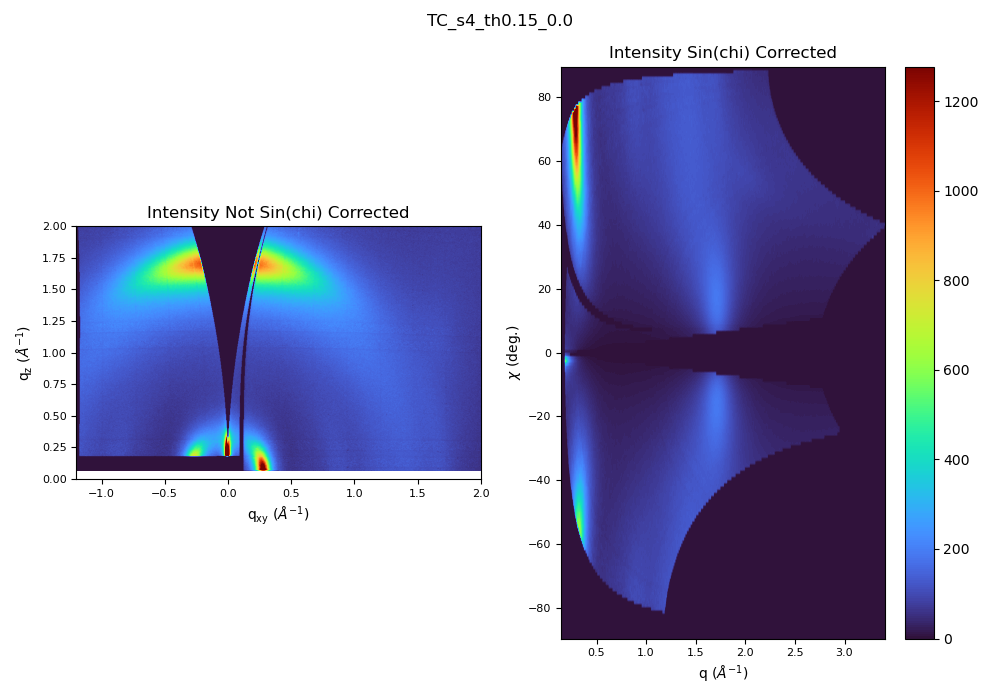

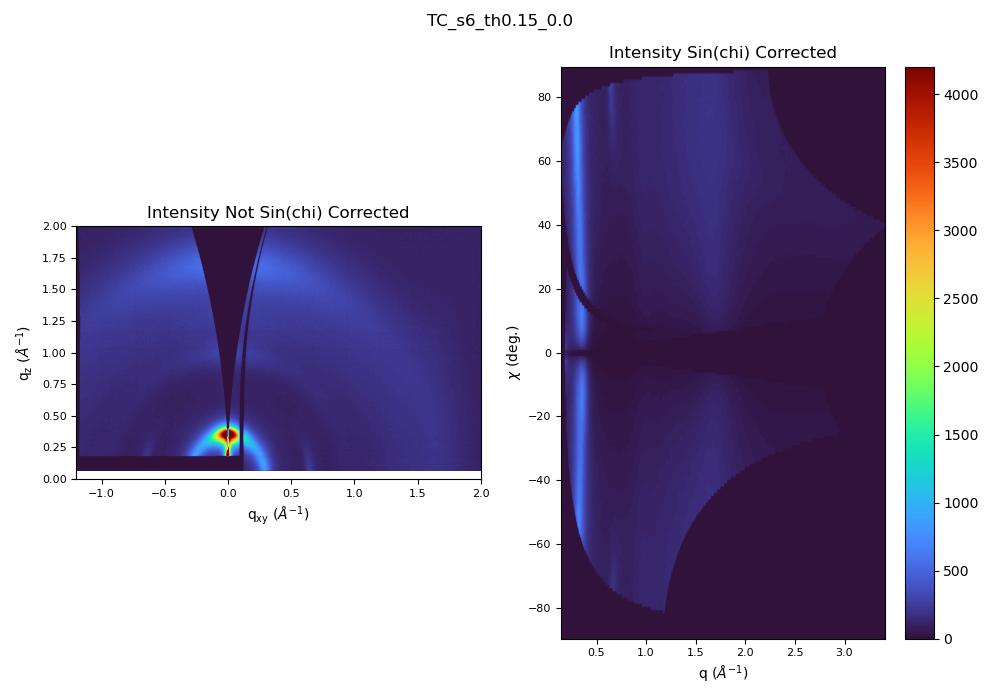

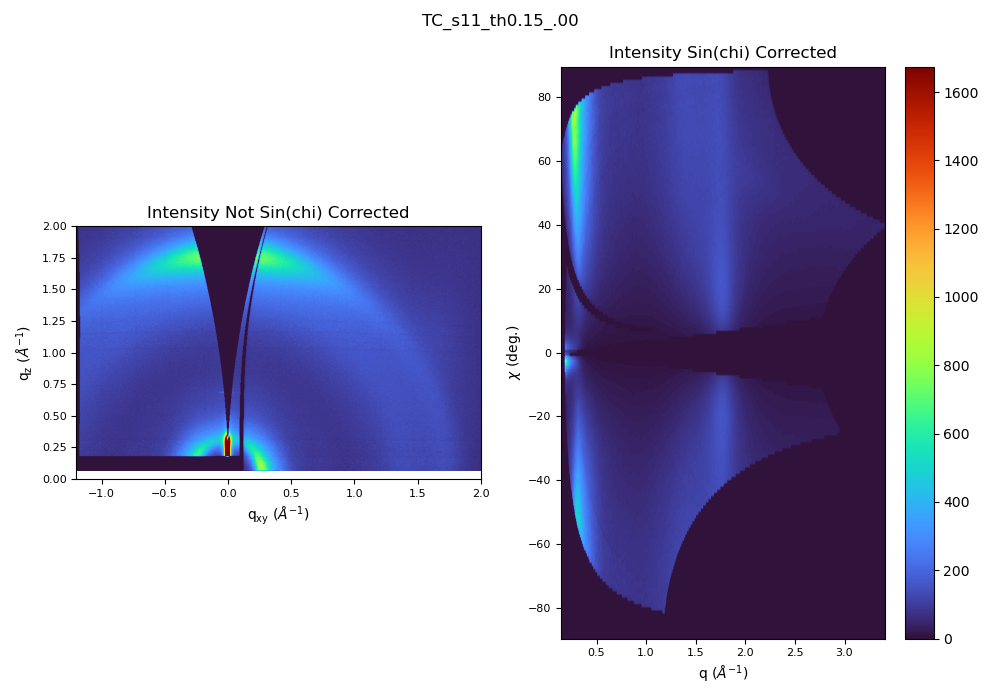

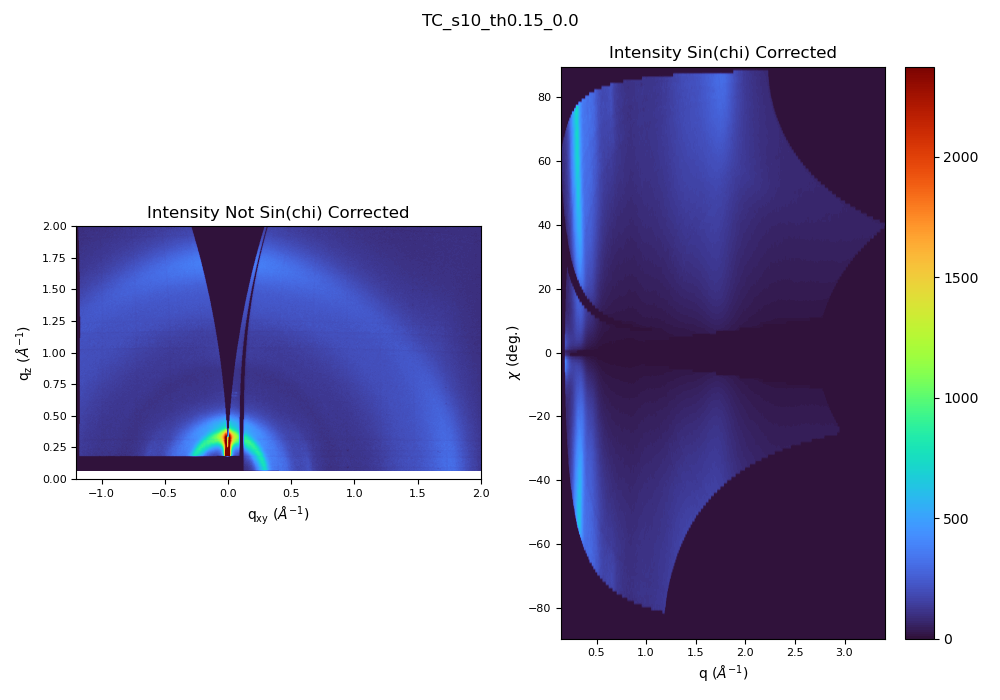

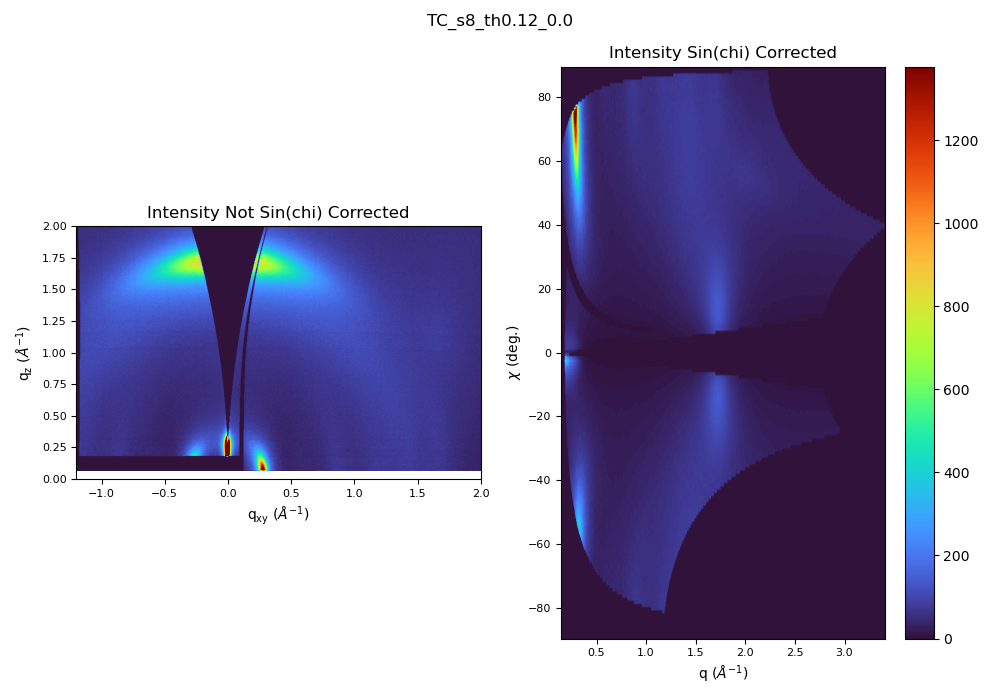

...

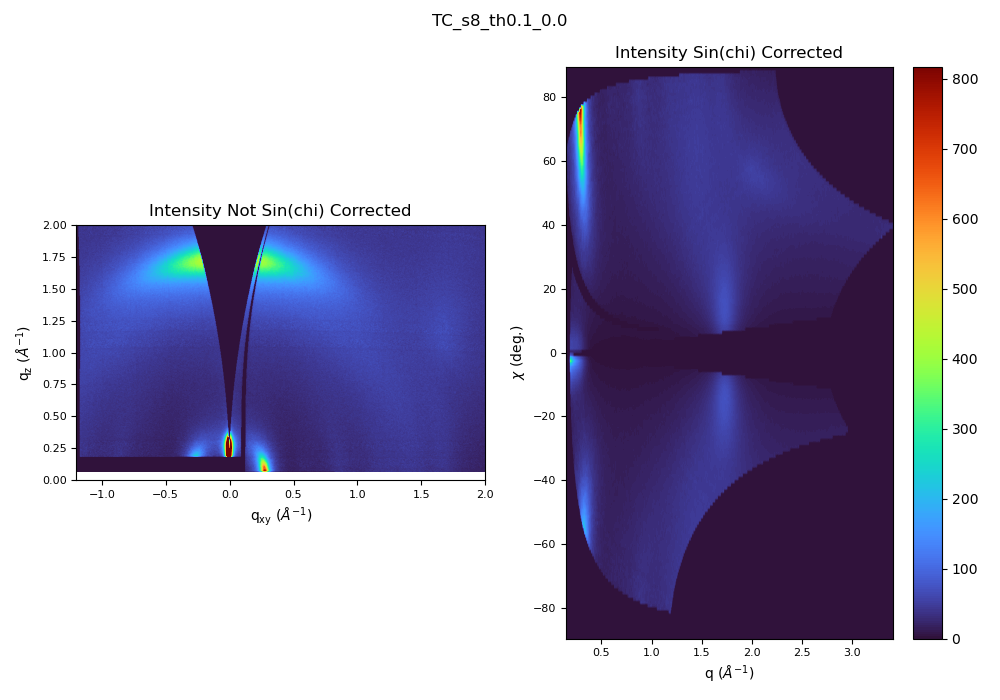

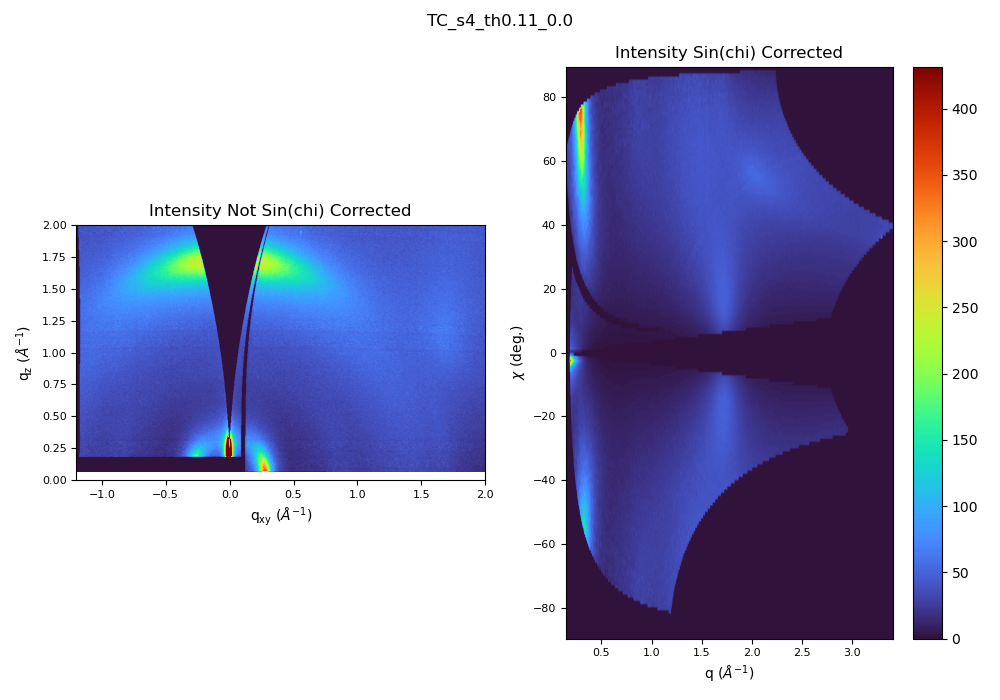

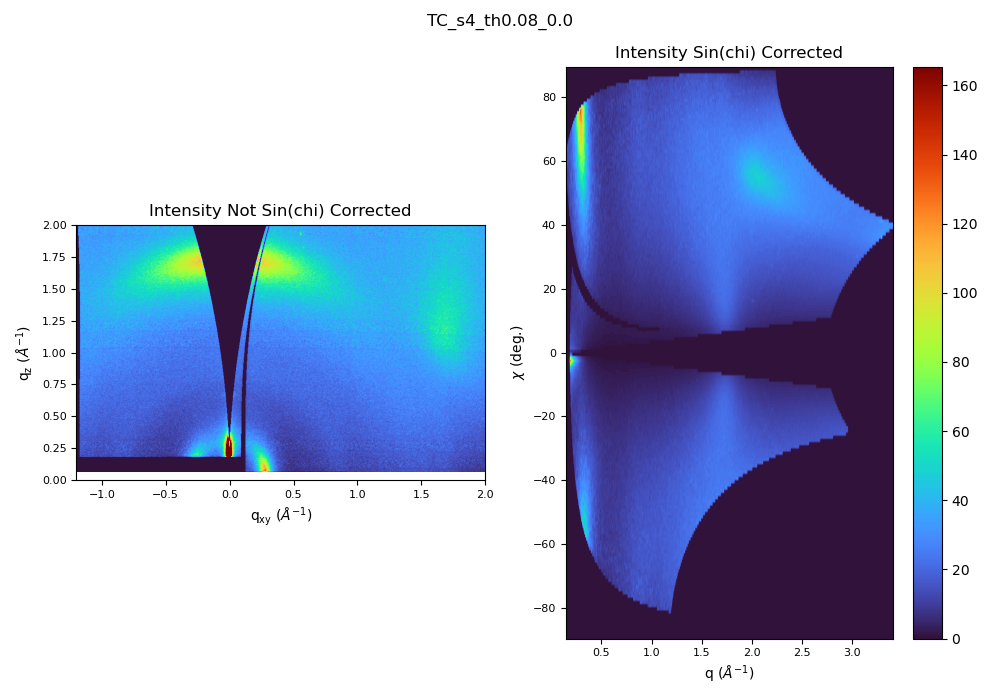

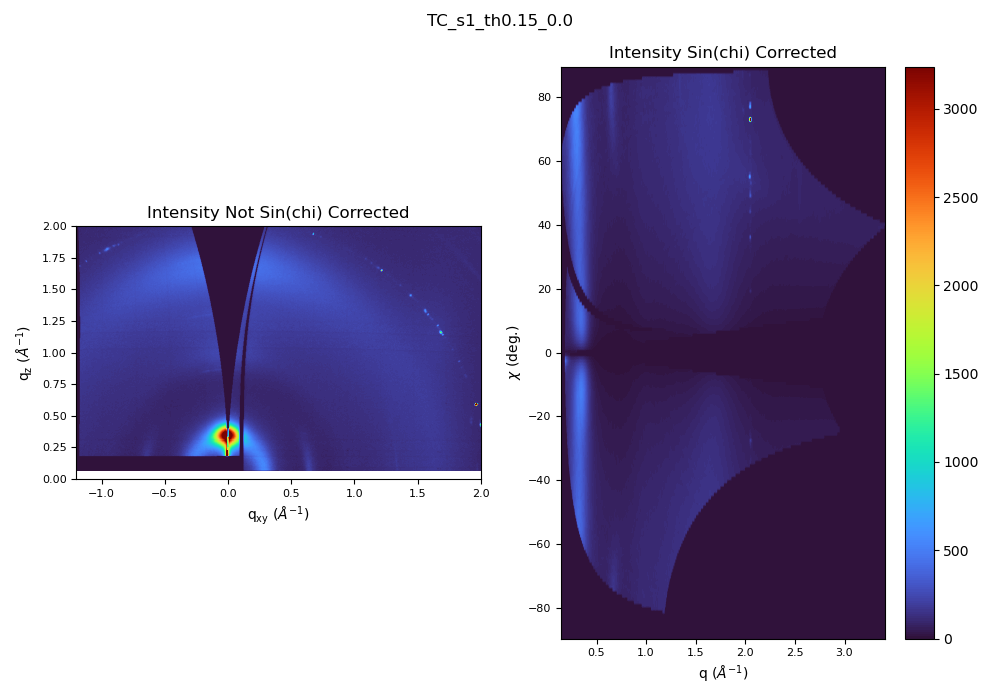

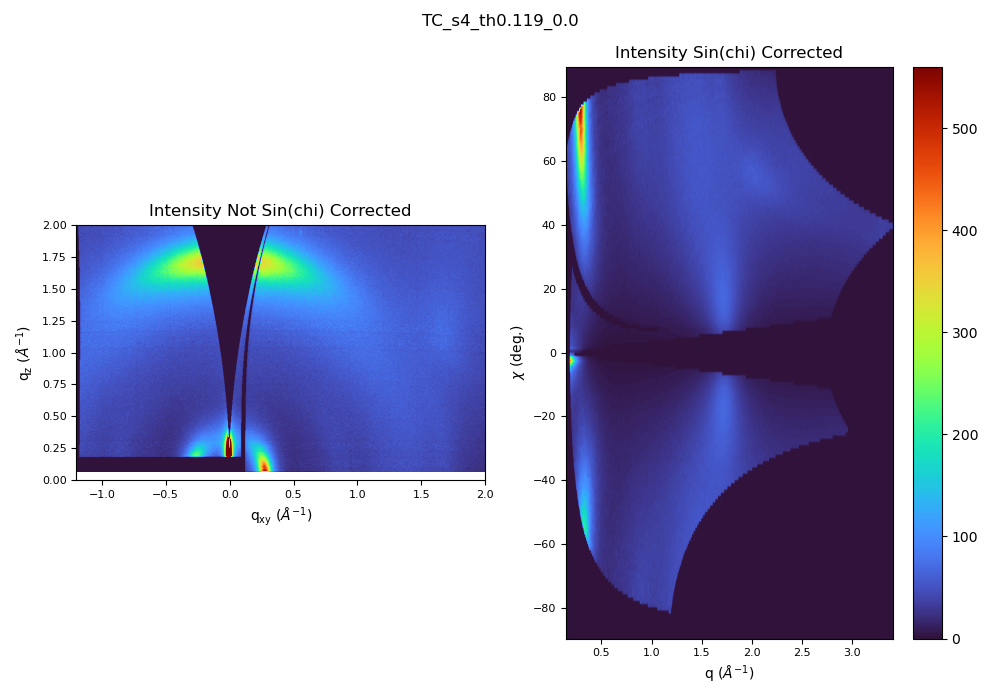

In [9]:
import glob
import re

#specify the path to where you want qmaps (2D images) and linecuts (1D data) saved
qmap_path = '/Volumes/One Touch/NSLS2_March2023/analysis/AL_giwaxs_analyzed/qmaps/'
q_linecut_path = '/Volumes/One Touch/NSLS2_March2023/analysis/AL_giwaxs_analyzed/q_linecuts/'
chi_linecut_path = '/Volumes/One Touch/NSLS2_March2023/analysis/AL_giwaxs_analyzed/chi_linecuts/'

#load up pygix transform object with your calibration (.poni) file
pg = pygix.Transform()
pg.load('/Volumes/One Touch/NSLS2_March2023/analysis/calibration/CeO2_fixed.poni')
#sample orientation is 3 for GIWAXS
pg.sample_orientation = 3
#load incident angle here (I have it mined from filename in later code if applicable)
pg.incident_angle = 0.10
#load your mask
mask = fabio.open('/Volumes/One Touch/NSLS2_Oct2022/800k_mask_stitched.edf').data

print(pg)

#initialize plot object, change directory to raw data folder, initialize counting variable
os.chdir('/Volumes/One Touch/NSLS2_March2023/waxs/AL_stitched')
i=0


#this loop retrieves all detector images and runs data reduction on each
for name in glob.glob('AL_short_A1_pos1_x-0.000_th0.140_20.00s_987962_waxs_stitched.tiff'):
    fig, (ax1, ax2) = subplots(1,2, figsize=(10,7))
    sam = fabio.open(name).data
    
    #mine the shortened sample name from the filename
    name_idx_start = name.find('TC')
    name_idx_end = name.find('_pos')
    name_short = name[name_idx_start:name_idx_end]
    
    #mine the incident angle from filename and import it into pygix transform
    idx_start = name.find('_th')
    idx_start = idx_start + 3
    idx_end = idx_start + 5
    incident_angle = name[idx_start:idx_end]
    incident_angle = float(incident_angle)
    pg.incident_angle = incident_angle
    
    #mine the x-position of sample stage
    x_idx_start = name.find('x')
    x_idx_start = x_idx_start + 2
    x_idx_end = x_idx_start + 3
    x_pos = name[x_idx_start:x_idx_end]
    
    #create new shortened filename based on mined data
    filename_short = name_short + '_th' + str(incident_angle) + '_' + x_pos

    
    #Convert detector image to q-space
    sam_rec, qxy, qz = pg.transform_reciprocal(sam, 
                                               method = 'bbox', #for some reason splitpix doesnt work?
                                               unit='A',
                                               mask=mask,
                                               correctSolidAngle=True)
        
    #plot q space detector image
    img_min = np.percentile(sam_rec, 2)
    img_max = np.percentile(sam_rec, 99.95)
    ax1.imshow(sam_rec,
               norm=matplotlib.colors.Normalize(vmin=img_min,vmax=img_max),
               cmap='turbo',
               extent=(np.min(qxy),np.max(qxy),np.min(qz),np.max(qz)),
               origin = 'lower')
    ax1.set_ylim(0, 2)
    ax1.set_xlim(-1.2, 2)
    ax1.set_title('Intensity Not Sin(chi) Corrected')
    ax1.set_xlabel('$\mathregular{q_{xy}}$ ($\AA^{-1}$)')
    ax1.set_ylabel('$\mathregular{q_z}$ ($\AA^{-1}$)')
    ax1.tick_params(axis='both', which='major', labelsize=8)
    
    #convert detector image to caked qspace (chi vs q plot)
    sam_cake, qr, chi = pg.transform_image(sam, process='polar',
                                           method = 'bbox',
                                           unit='q_A^-1',
                                           mask=mask,
                                           correctSolidAngle=True)
    #apply sin(chi) correction to each pixel of the caked image
    sam_cake_corr = sin_chi_cake(sam_cake)
    
    #plot the q space sin(chi) corrected cake plot
    cake = ax2.imshow(sam_cake_corr,
                norm=matplotlib.colors.Normalize(vmin=img_min,vmax=img_max),
                cmap='turbo',
                extent=(np.min(qr),np.max(qr),np.min(chi),np.max(chi)),
                origin = 'lower',
                aspect='auto')
    ax2.set_xlabel('$\mathregular{q}$ ($\AA^{-1}$)')
    ax2.set_ylabel('$\chi$ (deg.)')
    ax2.tick_params(axis='both', which='major', labelsize=8)
    ax2.set_title('Intensity Sin(chi) Corrected')
    plt.colorbar(cake, ax=ax2)
    plt.suptitle(filename_short)
    plt.tight_layout()

In [15]:
img_max

644.1065643920963

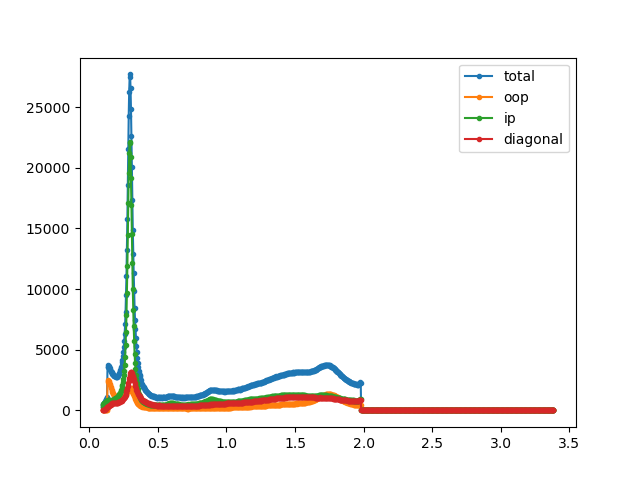

In [59]:
linecut_data = np.loadtxt(q_linecut_path + filename_short + '_5to85cut.txt')
oop_data = np.loadtxt(q_linecut_path + filename_short + '_5to30cut.txt')
ip_data = np.loadtxt(q_linecut_path + filename_short + '_60to85cut.txt')
diag_data = np.loadtxt(q_linecut_path + filename_short + '_32to58cut.txt')
fig, ax1 = subplots(1)
ax1.plot(linecut_data[:,0], linecut_data[:,1], marker='.', label = 'total')
ax1.plot(oop_data[:,0], oop_data[:,1], marker='.', label = 'oop')
ax1.plot(ip_data[:,0], ip_data[:,1], marker='.', label = 'ip')
ax1.plot(diag_data[:,0], diag_data[:,1], marker='.', label = 'diagonal')
plt.legend()
# ax1.set_xscale('log')
# ax1.set_yscale('log')

NameError: name 'filename_short' is not defined

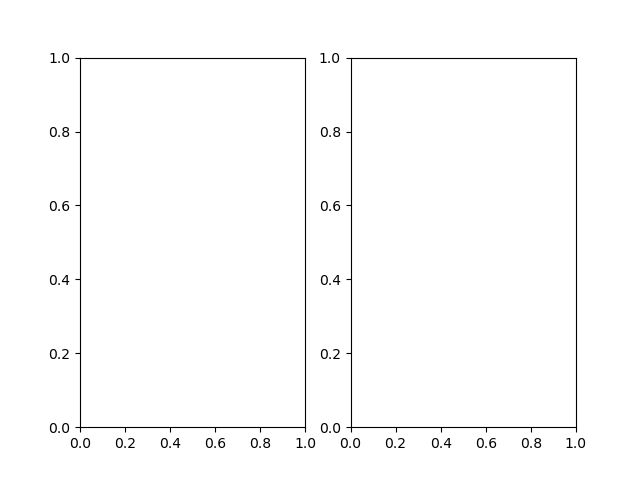

In [18]:
fig, (ax1, ax2) = subplots(1,2)
pipi_data = np.loadtxt(chi_linecut_path + filename_short + '_pipi_chi.txt')
lamella_data = np.loadtxt(chi_linecut_path + filename_short + '_lamella_chi.txt')
ax1.plot(pipi_data[:,0], pipi_data[:,1], marker='.')
ax1.set_title('Pi-Pi stacking peak 1.6-1.93 $\AA^{-1}$')
ax1.set_xlabel('Chi (deg)')
ax1.set_ylabel('Intensity (arb. units)')
ax2.plot(lamella_data[:,0], lamella_data[:,1], marker='.')
ax2.set_title('Lamella stacking peak 0.22-0.37 $\AA^{-1}$')
ax2.set_xlabel('Chi (deg)')
ax2.set_ylabel('Intensity (arb. units)')
plt.tight_layout()

In [ ]:
plt.close('all')

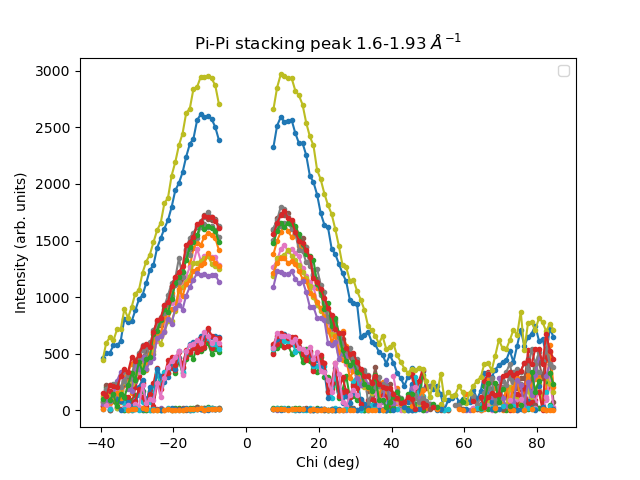

In [25]:
import glob
chi_linecut_path = '/Volumes/One Touch/NSLS2_Oct2022/full_analysis/chi_linecut/'
os.chdir(chi_linecut_path)
fig, ax1 = subplots(1,1)
for name in glob.glob('*MW*th0.1*pipi*'):
    name_idx_start = name.find('H1')
    name_idx_start = name_idx_start + 3
    name_idx_end = name.find('_pos')
    name_short = name[name_idx_start:name_idx_end]
    pipi_data = np.loadtxt(name)
    ax1.plot(pipi_data[:,0], pipi_data[:,1], marker='.', label=str(name))
ax1.set_title('Pi-Pi stacking peak 1.6-1.93 $\AA^{-1}$')
ax1.set_xlabel('Chi (deg)')
ax1.set_ylabel('Intensity (arb. units)')
ax1.legend()